### Laboratorium 5 - zadania

Jeśli nie posiadasz jeszcze pakietu `skimage`, zainstaluj go poniższym poleceniem:

In [1]:
!pip install scikit-image

In [2]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic
from skimage.util import img_as_float
from tqdm import tqdm

#### Zadanie 1 (1.0 pkt | 1.0 pkt)

Dany jest obraz `hare`. Wykonaj dla niego segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie takich superpikseli, które zawierają tylko fragmenty zająca, lub tylko fragmenty trawy (a nie jedno i drugie naraz). Sprawdź zachowanie algorytmu dla różnej liczby superpikseli.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja `mark_boundaries`.

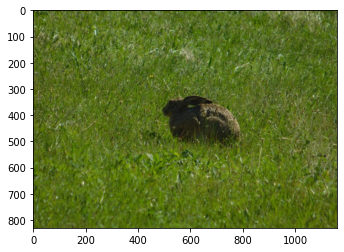

In [3]:
hare = cv2.imread('Zajac_kolor.jpg')[..., ::-1]
plt.imshow(hare);

In [27]:
def run_slic(img_RGB, numSegments = 50):
    image = img_as_float(img_RGB)
    sigmas = [5, 7, 10, 15]
    fig, ax = plt.subplots(2,2, figsize=(15,10))
    
    for i, sigma in enumerate(sigmas):
        row = int(i > 1)
        col = int(i % 2 == 1)
        segments = slic(image, n_segments = numSegments, sigma = sigma, start_label = 1)
        img_tmp = mark_boundaries(image, segments)
        ax[row][col].imshow(img_tmp)
        ax[row][col].set_title(f'Sigma {sigma}',fontsize=12)
        ax[row][col].axis("off")

def run_slic3(img_RGB, numSegments = 50):
    image = img_as_float(img_RGB)
    cc = [10.0, 20.0, 30.0, 50.0]
    fig, ax = plt.subplots(2,2, figsize=(15,10))
    
    for i, compact in enumerate(cc):
        row = int(i > 1)
        col = int(i % 2 == 1)
        segments = slic(image, n_segments = numSegments, sigma = 7,compactness=compact, start_label = 1)
        img_tmp = mark_boundaries(image, segments)
        ax[row][col].imshow(img_tmp)
        ax[row][col].set_title(f'Compactness {compact}',fontsize=12)
        ax[row][col].axis("off")
        
        
def run_slic2(img_RGB):
    image = img_as_float(img_RGB)
    num_segments = [20, 50, 100, 300]
    fig, ax = plt.subplots(2,2, figsize=(15,10))
    
    for i, numSegments in enumerate(num_segments):
        row = int(i > 1)
        col = int(i % 2 == 1)
        segments = slic(image, n_segments = numSegments, sigma = 5, start_label = 1)
        img_tmp = mark_boundaries(image, segments)
        ax[row][col].imshow(img_tmp)
        ax[row][col].set_title(f'Num segments {numSegments}',fontsize=12)
        ax[row][col].axis("off")
        
        

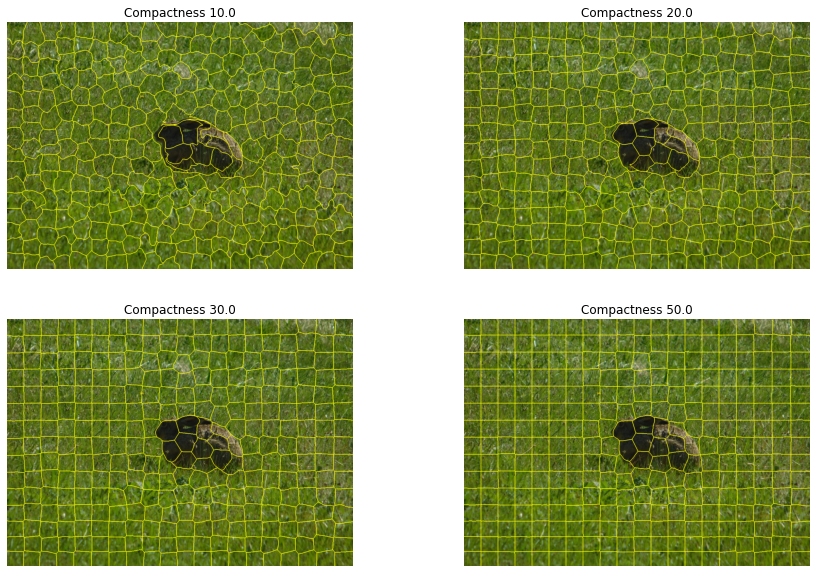

In [29]:
run_slic3(hare, 300)
plt.savefig('zad1v3.png')

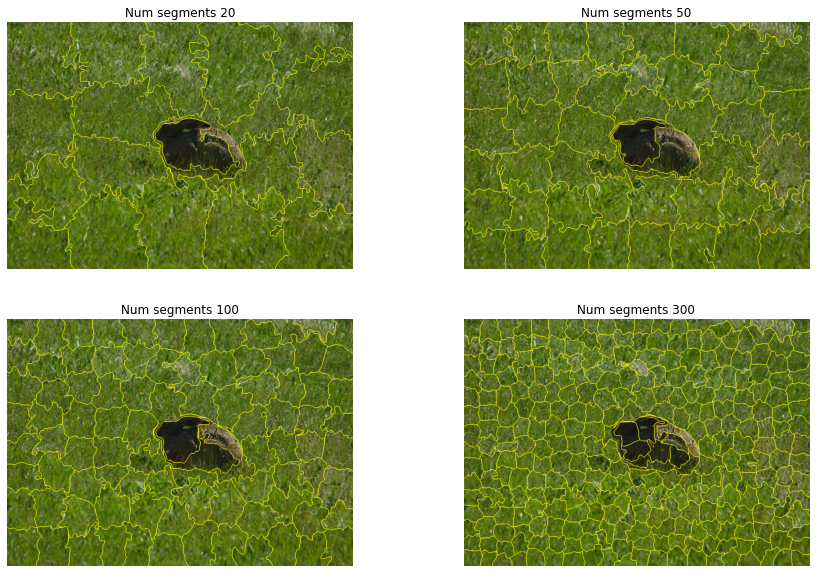

In [24]:
run_slic2(hare)
plt.savefig('zad1v1.png')

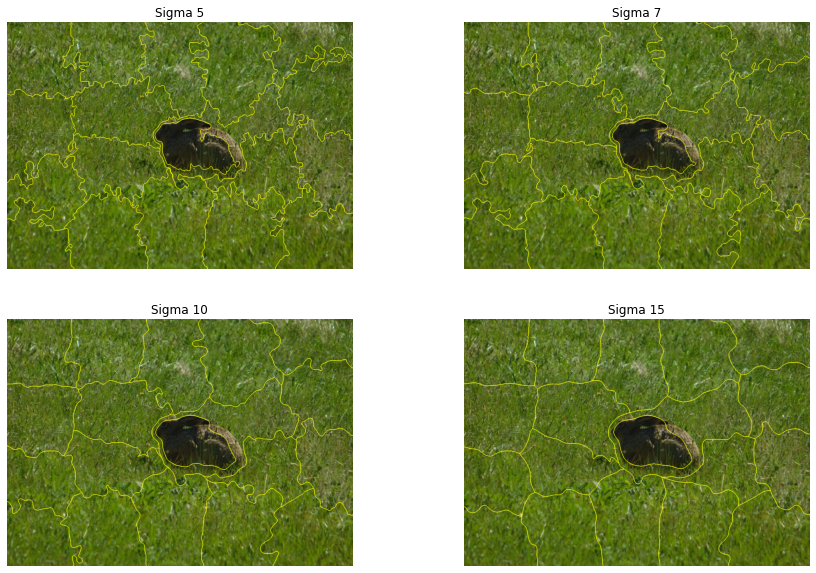

In [18]:
run_slic(hare, 20)

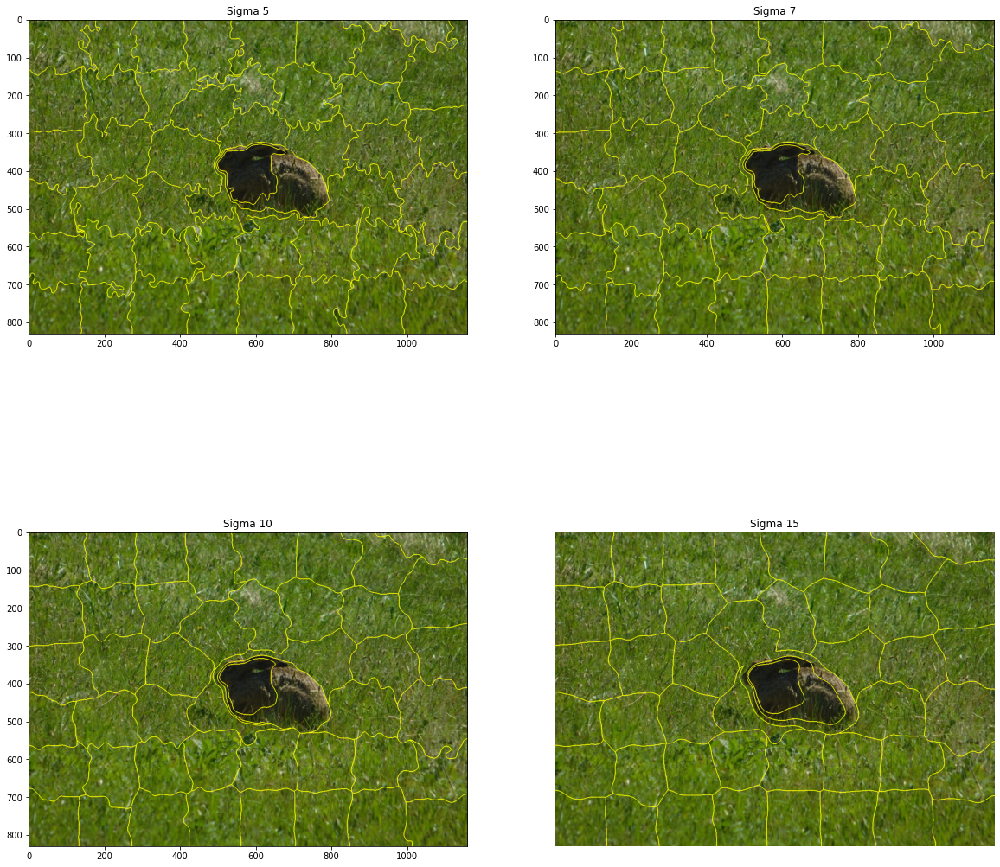

In [5]:
run_slic(hare, 50)

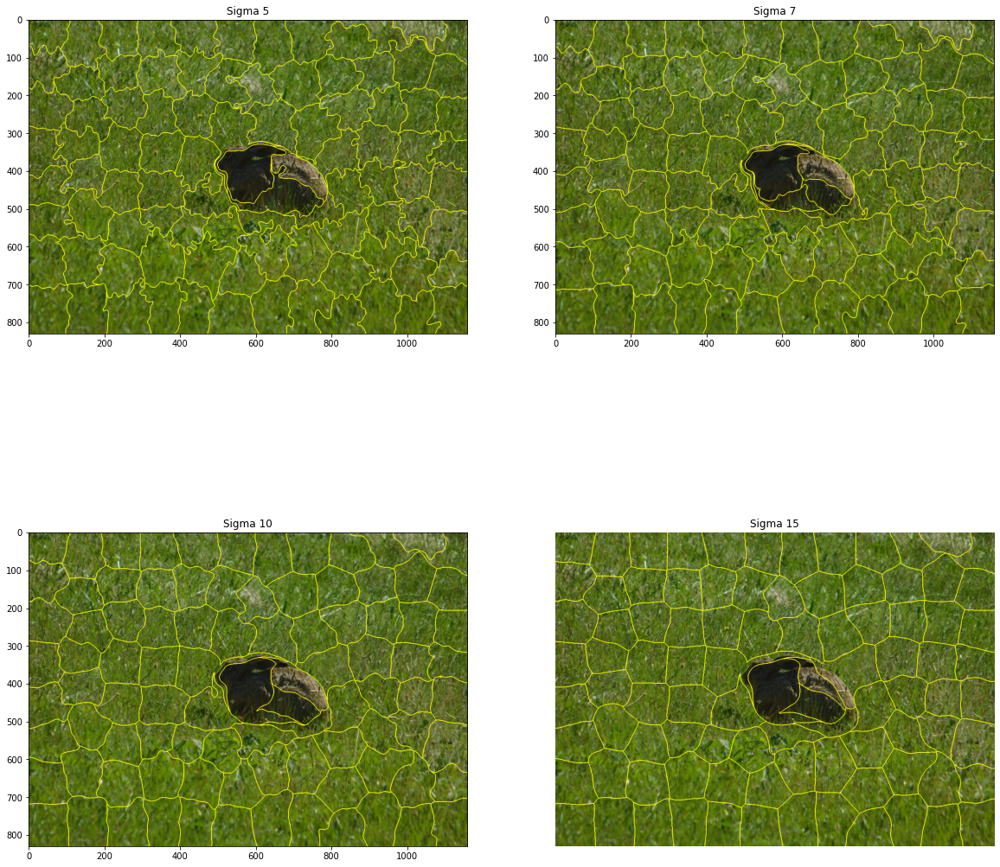

In [6]:
run_slic(hare, 100)

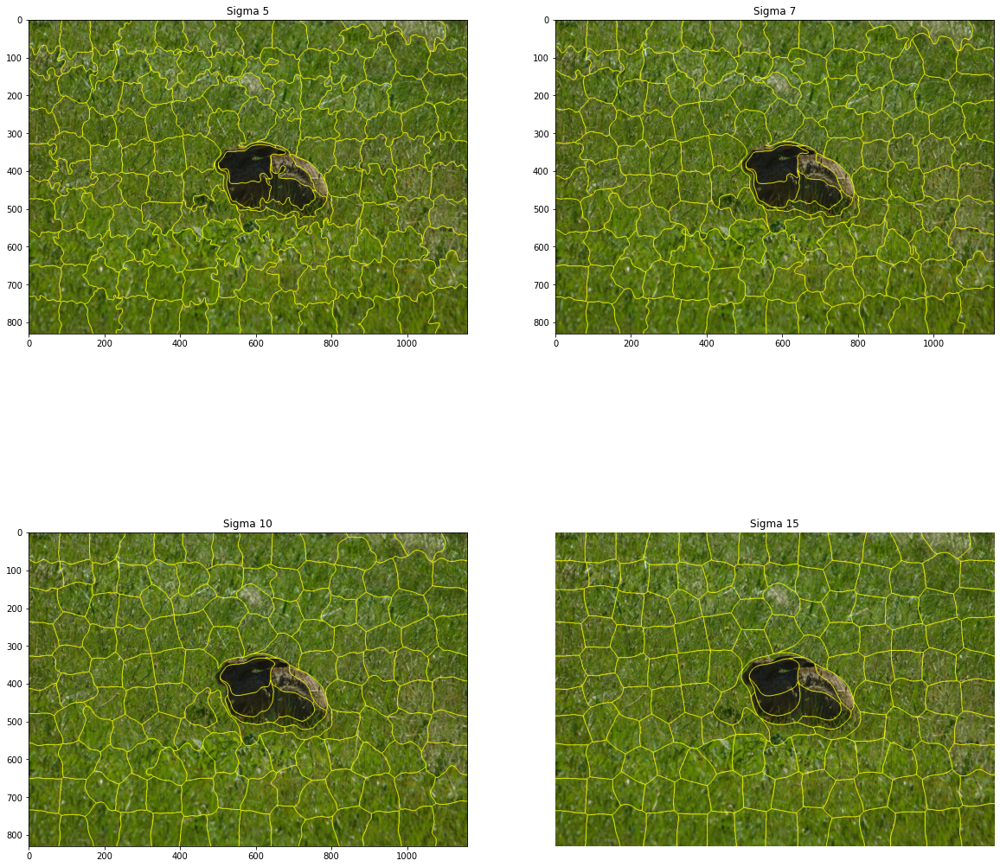

In [7]:
run_slic(hare, 150)

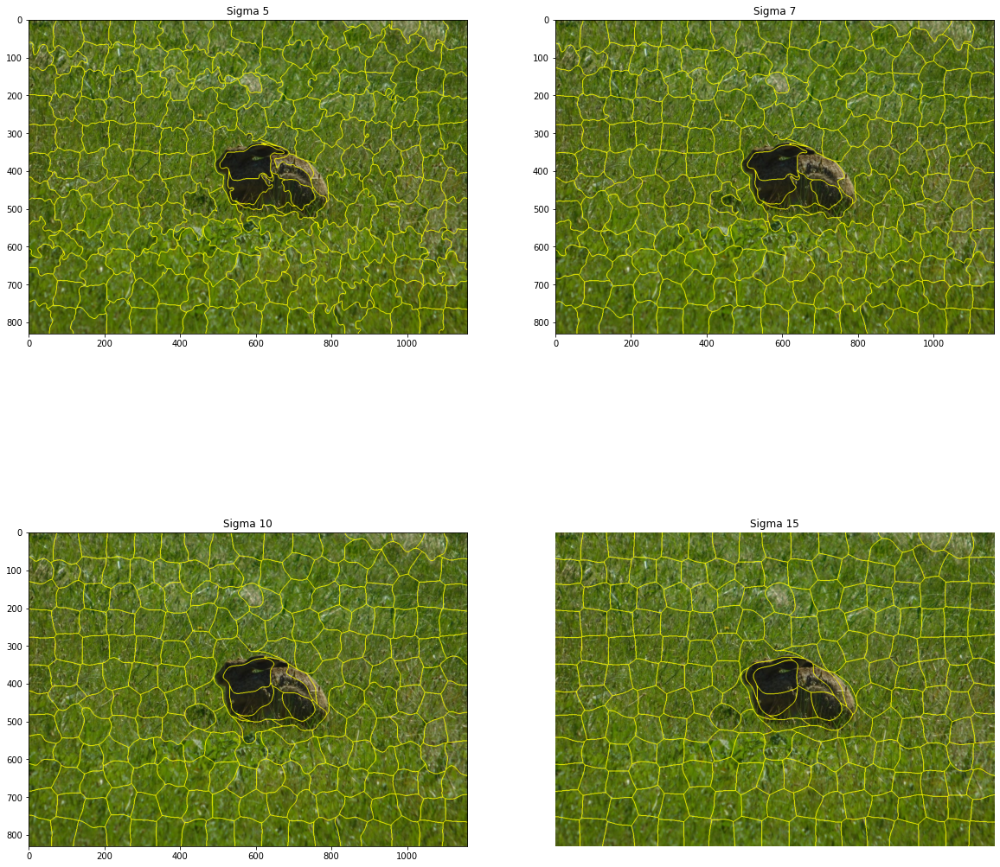

In [8]:
run_slic(hare, 200)

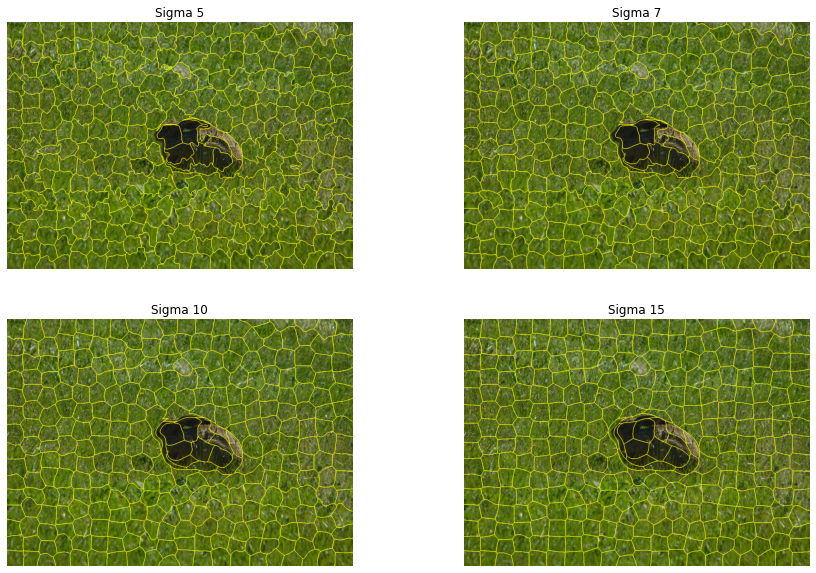

In [26]:
run_slic(hare, 300)
plt.savefig('zad1v2.png')

#### Zadanie 2 (2.0 pkt | 1.0 pkt)

Wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie zająca, drugi zawierający wyłącznie trawę. Wykorzystaj dowolny algorytm klasteryzacji (np. `cv2.kmeans`) używając *cech* superpikseli uzyskanych w zadaniu 1 jako danych wejściowych. Najprostszymi cechami, którymi można opisać superpiksele, są np. średnie wartości składowych barwy (pikseli, z których składa się superpiksel) - od nich zacznij. Zawsze możesz rozszerzyć rozwiązanie o bardziej wyrafinowane pomysły, jeśli starczy czasu.  
Zaprezentuj wyniki najlepiej za pomocą `mark_boundaries` albo po prostu wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać: ```A[B==5] = 0```. Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

In [32]:
from sklearn.preprocessing import StandardScaler

In [76]:
def postprocess(img_RGB, numSegments=300, sigma=7, compactness=20.0, k_means_attempts=20):
    
    img_Lab = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2Lab)
    image = img_as_float(img_Lab)
    
    segments = slic(image, n_segments = numSegments, sigma = sigma, compactness=compactness, start_label = 0)
    num_segments = len(np.unique(segments))
    
#     print('NUMBER OF SEGMENTS: ',num_segments)
    segments_array = []
    
    img_L = image[:,:,0]
    img_a = image[:,:,1]
    img_b = image[:,:,2]
    
    for segment in tqdm(range(num_segments)):
        L_mean = np.mean(img_L[segments==segment])
        a_mean = np.mean(img_a[segments==segment])
#         b_mean = np.mean(img_b[segments==segment])
        L_std = np.std(img_L[segments==segment])
        a_std = np.std(img_a[segments==segment])
#         b_std = np.std(img_b[segments==segment])
    
        segments_array.append([L_mean, a_mean, L_std, a_std])
    
    
    segments_array = np.float32(segments_array)
    scaler = StandardScaler()
    
    segments_array = scaler.fit_transform(segments_array)
    
    c, labels, centers = cv2.kmeans(
        data=segments_array,
        K=2,
        bestLabels=None,
        criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),
        attempts=k_means_attempts,
        flags=cv2.KMEANS_RANDOM_CENTERS
    )
    output = np.zeros_like(segments)
    
    for i in range(labels.shape[0]):
        output[segments==i] = labels[i]
#   
    fig, ax = plt.subplots(2,2, figsize=(15,10))
    ax[0][0].imshow(img_RGB)
    ax[0][0].axis('off')
    ax[0][0].set_title('Original',fontsize=12)
    ax[0][1].imshow(mark_boundaries(img_RGB, segments))
    ax[0][1].axis('off')
    ax[0][1].set_title('Superpixels', fontsize=12)
    ax[1][0].imshow(output, cmap='gray')
    ax[1][0].set_title('Mask', fontsize=12)
    ax[1][0].axis('off')
    output_rgb = np.ones((*output.shape,3), dtype=np.uint8)
    output_R = output_rgb[:,:,0]
    
    
    unique, counts = np.unique(output, return_counts=True)
    label_dict = dict(zip(unique, counts))

    if label_dict[0] > label_dict[1]:
        output_R[output == 1] = 255
    else:
        output_R[output == 0] = 255
    ax[1][1].imshow(cv2.addWeighted(img_RGB, 0.7, output_rgb, 0.3, 0))
    ax[1][1].set_title('Overlay', fontsize=12)
    ax[1][1].axis('off')
#     ax[1][1].imshow(output_R)

100%|████████████████████████████████████████| 299/299 [00:00<00:00, 385.97it/s]


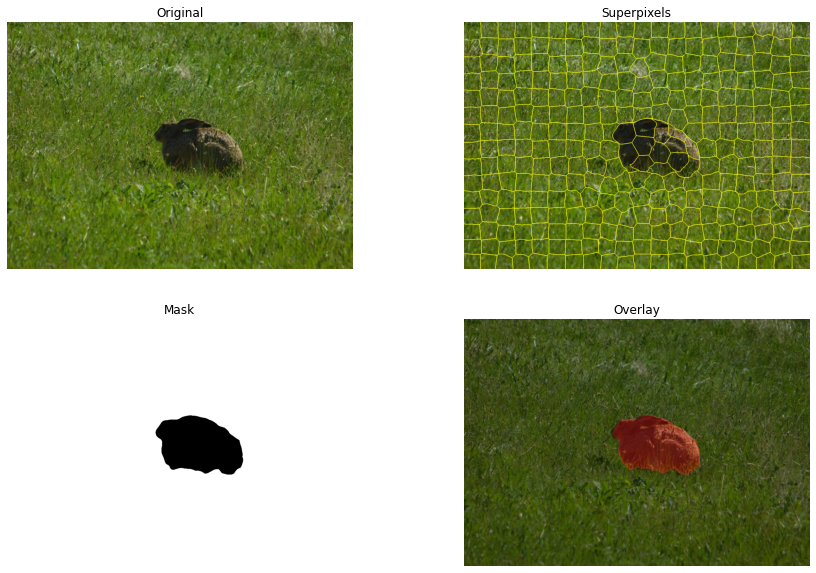

In [78]:
postprocess(hare, numSegments=300)
plt.savefig('zad2.png')

NUMBER OF SEGMENTS:  297


100%|████████████████████████████████████████| 297/297 [00:00<00:00, 372.23it/s]


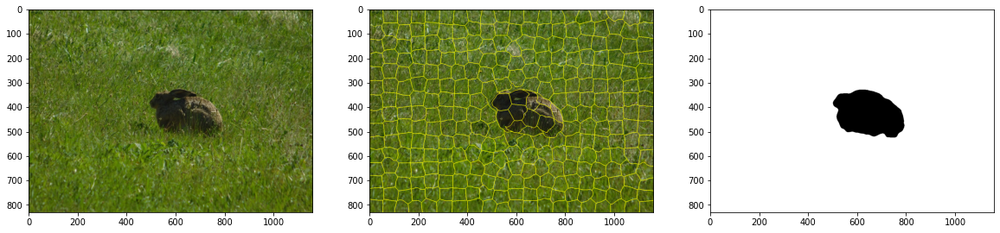

In [278]:
postprocess(hare, numSegments=300, compactness=15)

NUMBER OF SEGMENTS:  296


100%|████████████████████████████████████████| 296/296 [00:00<00:00, 364.40it/s]


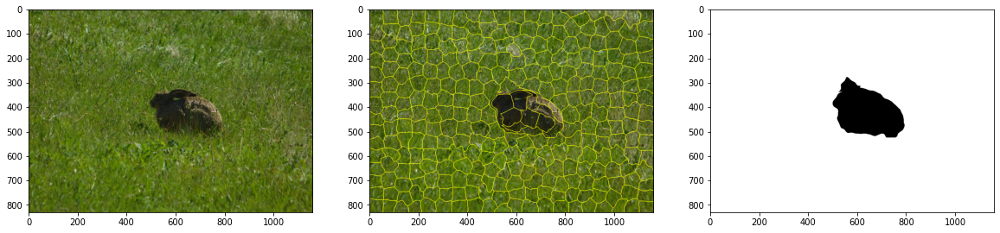

In [272]:
postprocess(hare, numSegments=300, compactness=10)

NUMBER OF SEGMENTS:  95


100%|██████████████████████████████████████████| 95/95 [00:00<00:00, 355.45it/s]


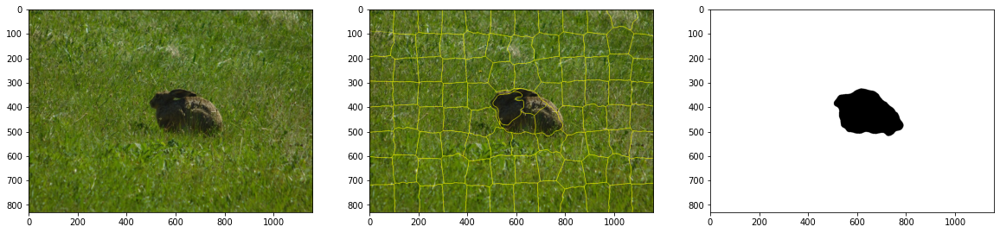

In [273]:
postprocess(hare, numSegments=100)

NUMBER OF SEGMENTS:  492


100%|████████████████████████████████████████| 492/492 [00:01<00:00, 391.40it/s]


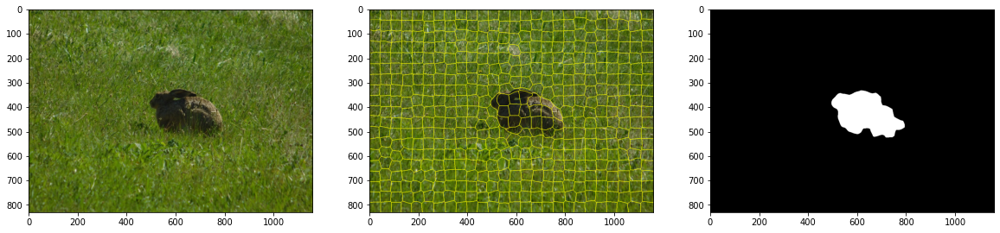

In [274]:
postprocess(hare, numSegments=500)

Możesz wykorzystać poniższy snippet by zredukować wynik segmentacji SLIC (`segments`) w oparciu o klasteryzację k-średnich (`labels`):

In [ ]:
# postprocessed = np.zeros_like(segments)
# for i in range(labels.shape[0]):
#     postprocessed[segments==i] = labels[i] # jeśli używamy indeksowania od 0 w SLIC
#     postprocessed[segments==i+1] = labels[i] # jeśli używamy indeksowania od 1